In [ ]:
# Importing Libraries
import os
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.sparse import csr_matrix
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
# change current directory
os.chdir("C:/Users/nikhi/Downloads/H&M_Personalized_Recommendations")

# Data Summary

## Articles dataset

In [ ]:
# Load the articles data
articles_df = pd.read_csv('data/articles.csv')

In [ ]:
profile = ProfileReport(articles_df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Customer dataset

In [ ]:
# Load the customers data
customers_df = pd.read_csv('data/customers.csv')

In [ ]:
profile = ProfileReport(customers_df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Transaction dataset

In [ ]:
# Load the transactions data
transactions = pd.read_csv('data/transactions_train.csv')

In [ ]:
profile = ProfileReport(transactions)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Convert t_dat to datetime object
transactions['t_dat'] = pd.to_datetime(transactions['t_dat'])

# Data Analysis

### Top 10 best-selling product types

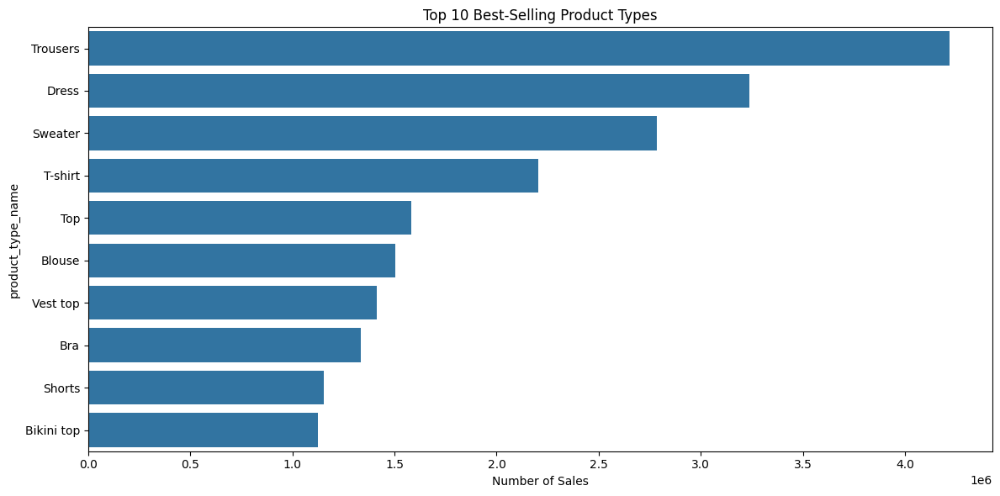

In [ ]:
top_products = transactions.merge(articles[['article_id', 'product_type_name']], on='article_id')
top_products = top_products['product_type_name'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_products.values, y=top_products.index)
plt.title('Top 10 Best-Selling Product Types')
plt.xlabel('Number of Sales')
plt.tight_layout()
plt.show()


Trousers lead H&M's sales at over 4 million units, with dresses at around 3.5 million and sweaters at approximately 3 million units, suggesting customers primarily shop for essential bottom wear and classic wardrobe staples.

### Seasonality affect on sales for different product types

In [ ]:
transactions_with_product = transactions.merge(articles[['article_id', 'product_type_name']], on='article_id')
transactions_with_product['month'] = transactions_with_product['t_dat'].dt.month
monthly_sales = transactions_with_product.groupby(['month', 'product_type_name'])['price'].sum().unstack()

monthly_sales


product_type_name,Accessories set,Alice band,Baby Bib,Backpack,Bag,Ballerinas,Beanie,Belt,Bikini top,Blanket,...,Vest top,Wallet,Washing bag,Watch,Waterbottle,Wedge,Weekend/Gym bag,Wireless earphone case,Wood balls,Zipper head
month,,,,,,,,,,,,,,,,,,,,,
1,NaN,0.374983,0.302831,4.441153,485.539627,35.854542,7.346593,239.667831,1430.200424,0.013542,...,1063.739831,7.143966,NaN,19.036746,4.855983,20.380695,4.929559,NaN,NaN,NaN
2,0.010153,0.402051,0.226119,5.848712,501.139475,60.403000,3.499627,239.325644,1514.778763,0.048746,...,984.366322,4.897542,NaN,11.848441,2.111339,26.370220,7.018932,NaN,0.004051,NaN
3,NaN,0.181271,0.284254,3.525746,490.910797,87.550068,1.531661,270.719746,2095.622712,0.054169,...,1501.765051,8.760051,0.050831,10.216644,1.173864,106.979322,3.626915,NaN,NaN,0.188576
4,NaN,0.521271,0.440593,1.237169,497.546017,135.147017,0.328034,264.794254,3701.022424,0.026339,...,2721.039220,10.502288,0.142322,9.512729,0.812169,306.513932,2.276695,NaN,NaN,0.162119
5,NaN,1.191525,0.268492,2.027237,523.436068,115.779271,0.426203,250.844424,4731.021949,NaN,...,2983.286068,6.231712,0.350729,8.531492,0.634847,329.479034,2.679627,NaN,NaN,0.078627
6,NaN,0.207441,0.258441,3.279881,546.960373,154.316169,0.496661,284.777169,5790.783983,NaN,...,4016.758559,4.470932,0.324305,11.265847,0.232169,382.474254,3.747407,NaN,NaN,0.139729
7,NaN,0.164881,0.604763,8.858119,529.636610,109.057763,0.760966,327.822288,3732.260695,NaN,...,3150.730458,7.979458,0.196085,11.020051,0.125085,261.069186,5.404153,0.461525,0.027864,0.005068
8,0.288881,0.154729,0.365305,10.612441,594.817508,68.705864,2.107831,303.982644,1758.493305,NaN,...,1845.763339,8.859271,0.404932,9.364373,0.063356,109.956305,8.472695,1.419797,0.005068,NaN
9,0.565559,0.496424,0.384339,4.527390,590.758593,71.626915,6.839966,365.285085,350.735695,NaN,...,1051.021186,6.755424,0.203322,13.187576,2.091712,29.423407,7.311169,0.284305,0.005068,0.005068


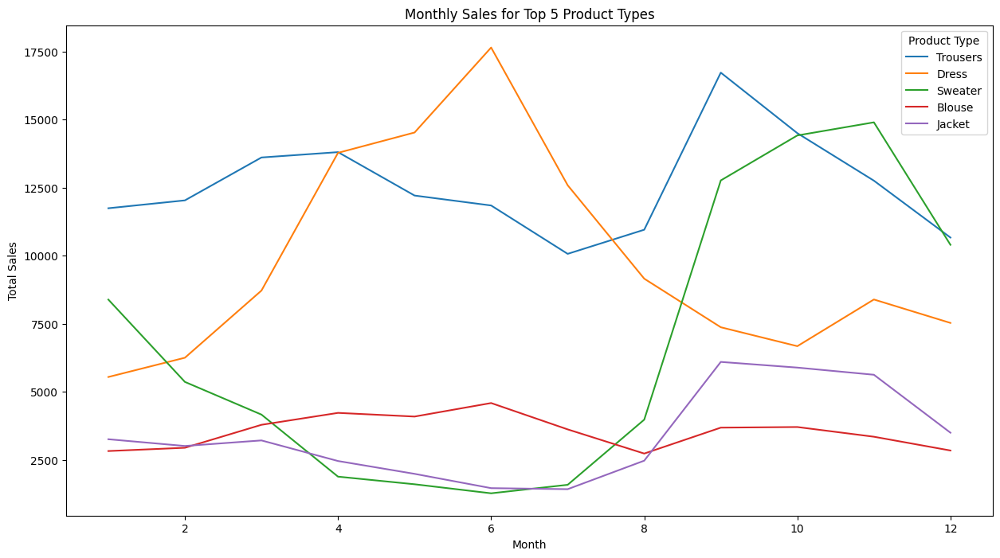

In [ ]:
# Select top 5 product types for visualization
top_5_products = monthly_sales.sum().nlargest(5).index
monthly_sales_top5 = monthly_sales[top_5_products]

plt.figure(figsize=(15, 8))
for product in top_5_products:
     plt.plot(monthly_sales_top5.index, monthly_sales_top5[product], label=product)
plt.title('Monthly Sales for Top 5 Product Types')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.legend(title='Product Type')
plt.show()

The data shows strong seasonality, with dresses peaking around month 6 (summer), while sweaters and trousers show increased sales starting from month 8 (fall/winter), indicating clear weather-dependent buying patterns.

### Top 10 best-selling colors

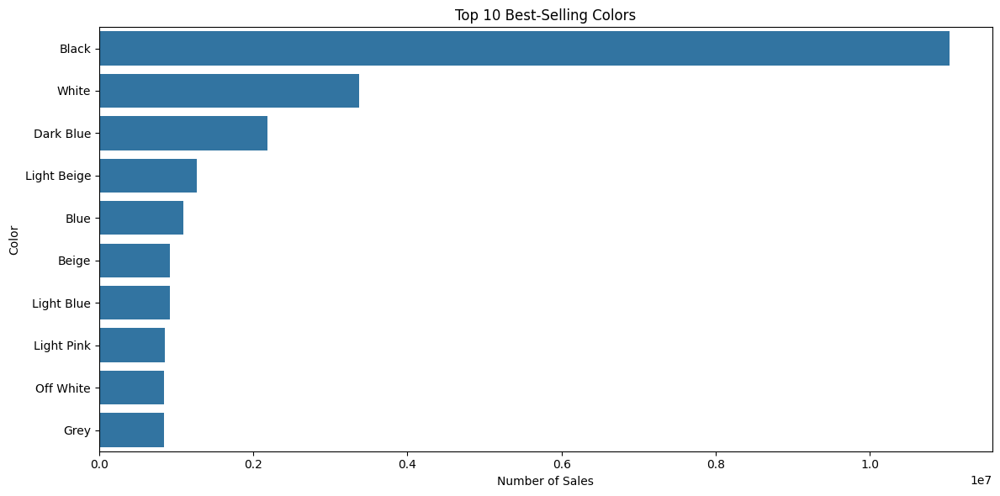

In [ ]:
top_colors = transactions.merge(articles[['article_id', 'colour_group_name']], on='article_id')
top_colors = top_colors['colour_group_name'].value_counts().head(10)

plt.figure(figsize=(12, 6))
sns.barplot(x=top_colors.values, y=top_colors.index)
plt.title('Top 10 Best-Selling Colors')
plt.xlabel('Number of Sales')
plt.ylabel('Color')
plt.tight_layout()
plt.show()

Black and white dominate color preferences with black having over 10 million sales and white around 4 million, suggesting customers strongly favor these versatile, classic colors that can be easily mixed and matched in their wardrobes.

### Color Popularity by Product Category

In [ ]:
df = transactions.merge(articles[['article_id', 'colour_group_name', 'product_type_name']], on='article_id')

# Get top 5 product categories and top 5 colors
top_categories = df['product_type_name'].value_counts().nlargest(5).index
top_colors = df['colour_group_name'].value_counts().nlargest(5).index

# Create a pivot table
color_category_pivot = df[df['product_type_name'].isin(top_categories) & df['colour_group_name'].isin(top_colors)]
color_category_pivot = color_category_pivot.pivot_table(values='article_id', index='product_type_name',
                                                        columns='colour_group_name', aggfunc='count', fill_value=0)



print(color_category_pivot)

colour_group_name    Black    Blue  Dark Blue  Light Beige   White
product_type_name                                                 
Dress              1229581   60713     226971       163689  218016
Sweater             605627   33349     197724       148660  183896
T-shirt             576594   15210     144798        48415  595249
Top                 606013    9603      71736        87610  280703
Trousers           1498618  520499     564447       139499  165980


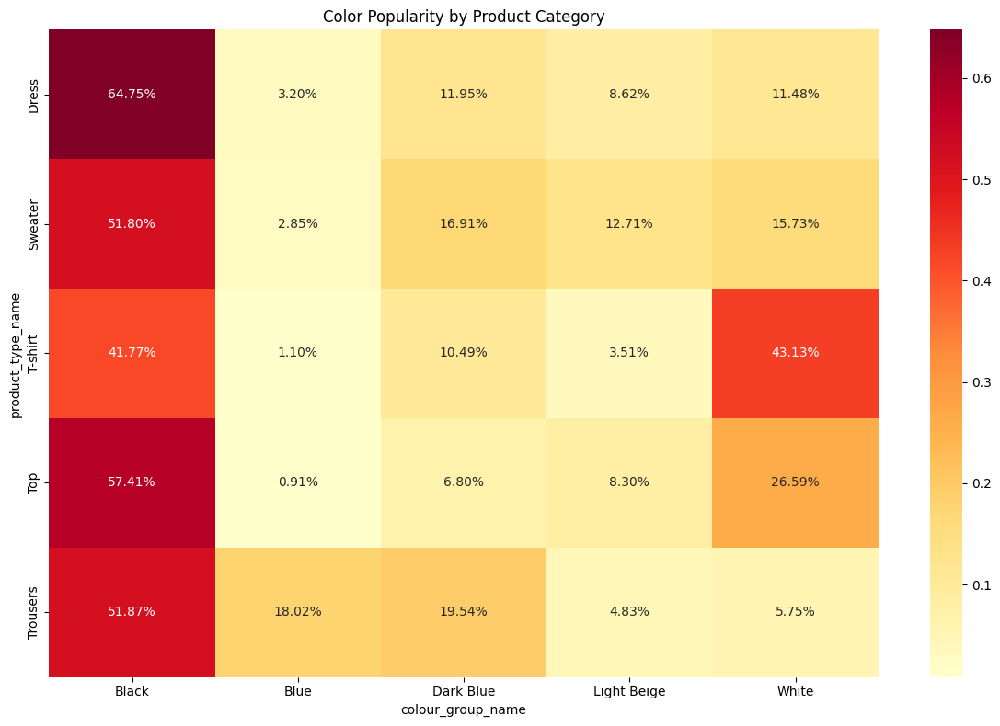

In [ ]:
# Normalize the data
color_category_pivot = color_category_pivot.div(color_category_pivot.sum(axis=1), axis=0)

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(color_category_pivot, annot=True, fmt='.2%', cmap='YlOrRd')
plt.title('Color Popularity by Product Category')
plt.tight_layout()
plt.show()

Black is the dominant color across all categories, especially in dresses (64.75%) and tops (57.41%), while T-shirts show a more balanced distribution between black (41.77%) and white (43.13%), indicating different color preferences for different garment types.

In [ ]:
print("Most popular color for each top product category:")
for category in top_categories:
    top_color = color_category_pivot.loc[category].idxmax()
    percentage = color_category_pivot.loc[category, top_color] * 100
    print(f"{category}: {top_color} ({percentage:.2f}%)")

Most popular color for each top product category:
Trousers: Black (51.87%)
Dress: Black (64.75%)
Sweater: Black (51.80%)
T-shirt: White (43.13%)
Top: Black (57.41%)


### Impact of Age on purchase behavior

In [ ]:
age_purchases = transactions.merge(customers[['customer_id', 'age']], on='customer_id').dropna(subset=['age'])
age_purchases = age_purchases.groupby('age').agg({
    'price': 'mean',
    'customer_id': 'count'
}).reset_index()
age_purchases.columns = ['age', 'avg_purchase', 'num_transactions']

In [ ]:
age_purchases

,age,avg_purchase,num_transactions
0,16.0,0.022137,1531
1,17.0,0.022795,58698
2,18.0,0.023312,202326
3,19.0,0.023801,428847
4,20.0,0.024524,780751
...,...,...,...
79,95.0,0.027269,140
80,96.0,0.021197,31
81,97.0,0.028645,38
82,98.0,0.033850,99


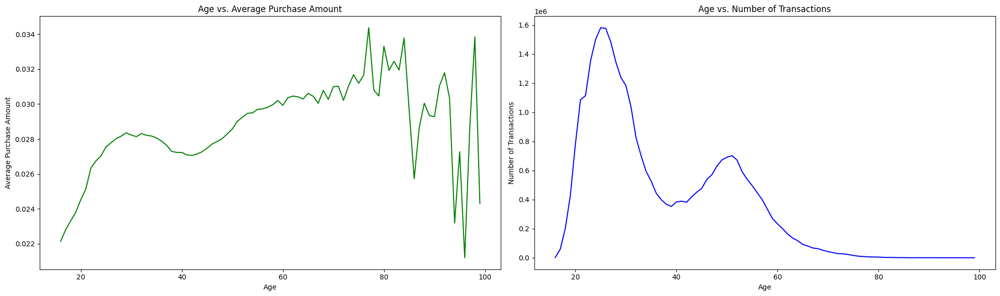

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Plot average purchase amount
sns.lineplot(x='age', y='avg_purchase', data=age_purchases, ax=ax1, color='g')
ax1.set_title('Age vs. Average Purchase Amount')
ax1.set_xlabel('Age')
ax1.set_ylabel('Average Purchase Amount')

# Plot number of transactions
sns.lineplot(x='age', y='num_transactions', data=age_purchases, ax=ax2, color='b')
ax2.set_title('Age vs. Number of Transactions')
ax2.set_xlabel('Age')
ax2.set_ylabel('Number of Transactions')

plt.tight_layout()
plt.show()


While younger customers (around age 20-25) make the highest number of transactions, older customers (particularly those 60-80) tend to spend more per purchase, suggesting different shopping behaviors across age groups with younger buyers making frequent smaller purchases and older customers making fewer but larger purchases.

### Customer retention rate over different time periods

In [ ]:
first_purchase = transactions.groupby('customer_id')['t_dat'].min().reset_index()
last_purchase = transactions.groupby('customer_id')['t_dat'].max().reset_index()
customer_history = pd.merge(first_purchase, last_purchase, on='customer_id', suffixes=('_first', '_last'))
customer_history['days_between_purchases'] = (customer_history['t_dat_last'] - customer_history['t_dat_first']).dt.days

customer_history.head()

,customer_id,t_dat_first,t_dat_last,days_between_purchases
0,00000dbacae5abe5e23885899a1fa44253a17956c6d1c3...,2018-12-27,2020-09-05,618
1,0000423b00ade91418cceaf3b26c6af3dd342b51fd051e...,2018-09-21,2020-07-08,656
2,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,2018-09-20,2020-09-15,726
3,00005ca1c9ed5f5146b52ac8639a40ca9d57aeff4d1bd2...,2019-06-09,2019-06-09,0
4,00006413d8573cd20ed7128e53b7b13819fe5cfc2d801f...,2018-10-12,2020-08-12,670


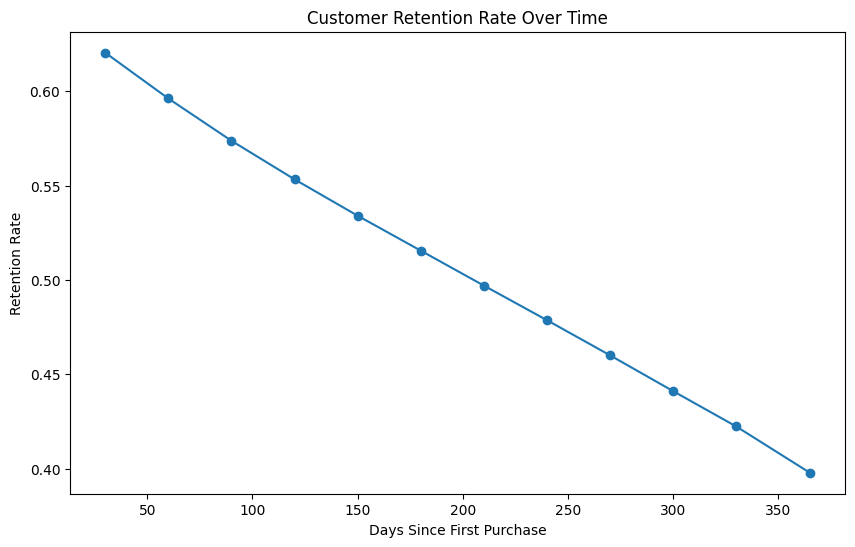

In [ ]:
retention_periods = [30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 365]
retention_rates = [
        (customer_history['days_between_purchases'] > period).mean()
        for period in retention_periods
    ]

plt.figure(figsize=(10, 6))
plt.plot(retention_periods, retention_rates, marker='o')
plt.title('Customer Retention Rate Over Time')
plt.xlabel('Days Since First Purchase')
plt.ylabel('Retention Rate')
plt.show()

The customer retention rate shows a clear downward trend, dropping from about 62% at day 50 to 40% by day 350, suggesting H&M needs to focus on strategies to maintain long-term customer engagement and loyalty.

### Customer segments based on purchasing behavior

In [ ]:
customer_features = transactions.groupby('customer_id').agg({
    'price': ['mean', 'sum'],
    'article_id': 'nunique',
    't_dat': lambda x: (x.max() - x.min()).days
}).reset_index()
customer_features.columns = ['customer_id', 'avg_price', 'total_spent', 'unique_items', 'days_active']

# Handle zero days active
customer_features['days_active'] = customer_features['days_active'].replace(0, 1)
customer_features['purchase_frequency'] = customer_features['unique_items'] / customer_features['days_active']


In [ ]:
customer_features_noId = customer_features.drop('customer_id', axis=1)
# Normalize features
scaler = StandardScaler()
features_normalized = scaler.fit_transform(customer_features_noId)

In [ ]:
customer_features_noId.shape

(1362281, 5)

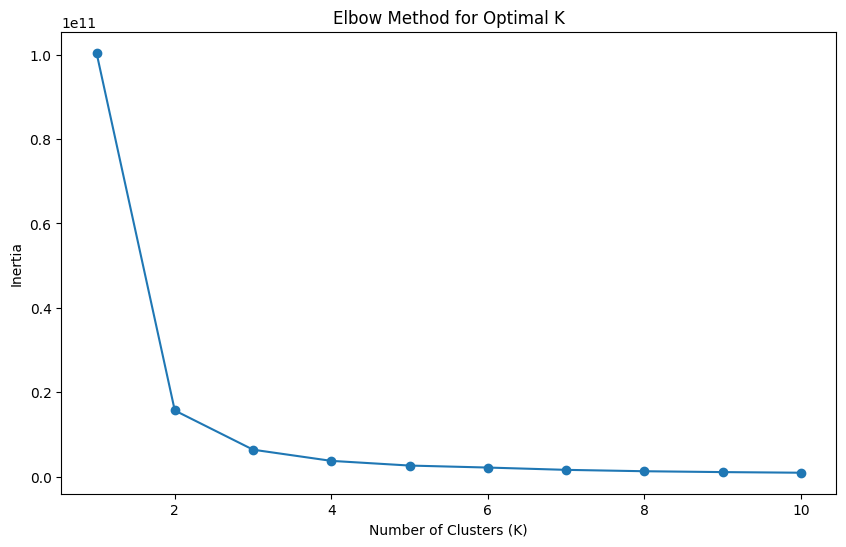

In [ ]:
def elbow_method(data, max_k):
    inertias = []
    for k in range(1, max_k+1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        inertias.append(kmeans.inertia_)

    plt.figure(figsize=(10, 6))
    plt.plot(range(1, max_k+1), inertias, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Inertia')
    plt.show()

elbow_method(customer_features_noId,10)

The elbow curve shows a sharp drop until k=2 and levels off after k=3, indicating 3 is the optimal number of clusters

In [ ]:
# Apply K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
customer_features['Cluster'] = kmeans.fit_predict(features_normalized)

C:\Users\nikhi\AppData\Local\Programs\Python\Python312\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


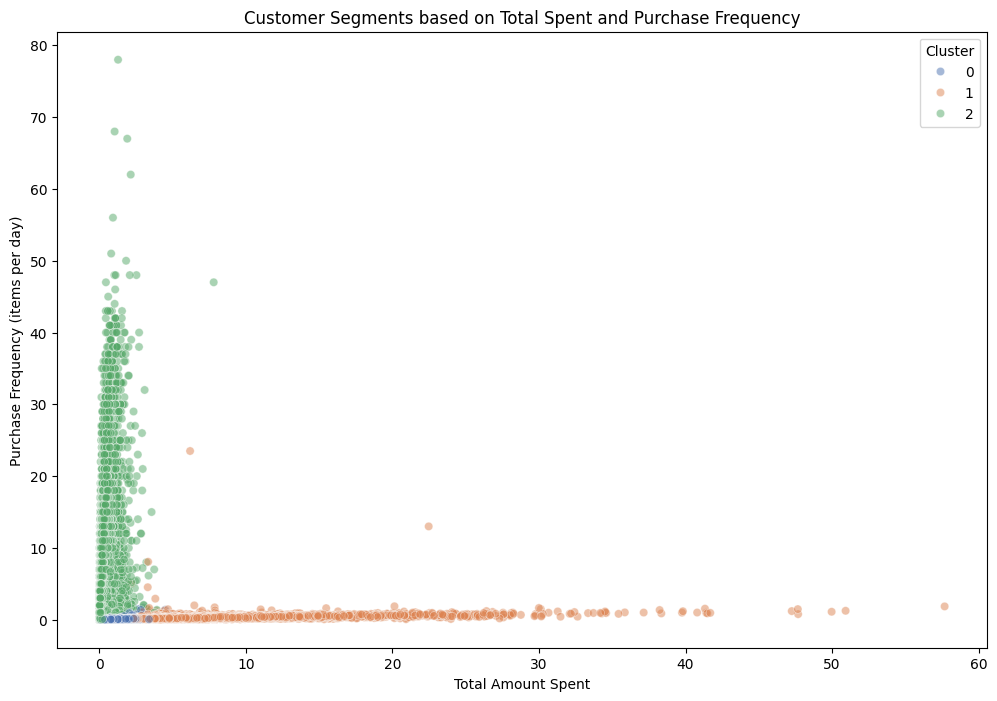

In [ ]:
# Visualize clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(data=customer_features, x='total_spent', y='purchase_frequency', hue='Cluster', palette='deep', alpha = 0.5)
plt.title('Customer Segments based on Total Spent and Purchase Frequency')
plt.xlabel('Total Amount Spent')
plt.ylabel('Purchase Frequency (items per day)')
plt.show()

In [ ]:
# Analyze cluster sizes
cluster_sizes = customer_features['Cluster'].value_counts().sort_index()
print("Cluster Sizes:")
print(cluster_sizes)

Cluster Sizes:
Cluster
0    599204
1     67556
2    695521
Name: count, dtype: int64


In [ ]:
# Analyze cluster characteristics
cluster_stats = customer_features.groupby('Cluster').agg({
    'avg_price': ['mean', 'median'],
    'total_spent': ['mean', 'median'],
    'unique_items': ['mean', 'median'],
    'purchase_frequency': ['mean', 'median']
})

# Flatten multi-level column names
cluster_stats.columns = ['_'.join(col).strip() for col in cluster_stats.columns.values]
cluster_stats = pd.DataFrame(cluster_stats.T)
print("\nCluster Characteristics:")
print(cluster_stats)


Cluster Characteristics:
Cluster                            0           1         2
avg_price_mean              0.026954    0.030522  0.030135
avg_price_median            0.025744    0.029594  0.026042
total_spent_mean            0.788450    4.586453  0.147172
total_spent_median          0.609542    3.776271  0.094847
unique_items_mean          26.057039  125.067411  4.663990
unique_items_median        21.000000  108.000000  3.000000
purchase_frequency_mean     0.052327    0.192048  2.143803
purchase_frequency_median   0.043716    0.165975  1.000000


Based on the customer segmentation analysis, there are three distinct customer segments:

1. Cluster 1 (High Frequency, Low Spend): These customers make very frequent purchases (avg 2.14 items/day) but spend less per transaction, suggesting budget-conscious regular shoppers who buy few items frequently.

2. Cluster 0 (High Value): This group shows the highest total spend (mean 4.6) with moderate purchase frequency (0.19 items/day), representing loyal customers who make substantial regular purchases.

3. Cluster 2 (Low Engagement): These customers have both low purchase frequency (0.05 items/day) and moderate total spend (0.79), indicating occasional shoppers who might need targeted engagement strategies.